In [1]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.cm as mcm
import matplotlib.pyplot as plt
from scipy.ndimage import rotate, zoom
from PythonSIFT.siftmatch import match_template
from PythonSIFT.siftdetector import detect_keypoints
from skimage.feature import blob_log, blob_doh
from skimage.color import rgb2gray
from imageio import mimsave, get_writer
from pathlib import Path
import math, time, multiprocessing as mp
from tqdm import tqdm

In [2]:
# input: - set of images to be displayed
#        - the amount of images per row and column
# returns: nothing
# effect: displays the images ordered with rows and columns given
def plotNImages(imgs, row, col, titles=[], figsize=(3,15), cscheme='viridis'):
    index = 0
    if row == 1 and col == 1:
        fig, ax = plt.subplots(row, col, figsize=(2,7))
        fig.dpi = 200
        ax.imshow(imgs[index],cmap=plt.get_cmap(cscheme))
        if(len(titles) > 0):
            ax.set_title(titles[index], fontsize=5)
        ax.set_xticks([])
        ax.set_yticks([])
    else:
        fig, ax = plt.subplots(row, col, figsize=figsize)
        fig.dpi = 700
        for j in range(row):
            for k in range(col):
                if(index < len(imgs)):
                    if(row > 1 and col > 1):
                        ax[j,k].imshow(imgs[index],cmap=plt.get_cmap(cscheme));
                        if(len(titles) > 0):
                            ax[j,k].set_title(titles[index], fontsize=5)
                        ax[j,k].set_xticks([])
                        ax[j,k].set_yticks([])
                    else:
                        ax[max(j, k)].imshow(imgs[index],cmap=plt.get_cmap(cscheme));
                        if(len(titles) > 0):
                            ax[max(j,k)].set_title(titles[index], fontsize=5)
                        ax[max(j,k)].set_xticks([])
                        ax[max(j,k)].set_yticks([])
                index += 1
    fig.tight_layout()
    plt.draw()

In [3]:
def comic(img, canny_threshs=[100,110],edge_size=(3,3), inv=False):
    # edge detection on grayscale image for faster results
    gray = cv2.cvtColor(img, cv2.COLOR_BGRA2GRAY)
    edges = cv2.blur(gray, (3, 3)) # get rid of noise
    edges = cv2.Canny(edges, canny_threshs[0], canny_threshs[1], apertureSize=3) # detect edges

    # make edges thicker
    kernel = np.ones(edge_size, dtype=np.float) / 15.0
    edges = cv2.filter2D(edges, 0, kernel)
    edges = cv2.threshold(edges, 50, 255, 0)[1]

    # convert back to BGR image (that's cv2's order not RGB)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

    # use a faster, more comprehnesible version of
    # a bilateral filter mean shift
    shifted = cv2.pyrMeanShiftFiltering(img, 5, 20)

    # now compose with the edges, the edges are white so take them away
    # to leave black
    if inv:
        return cv2.add(edges,shifted)
    return cv2.subtract(shifted, edges)

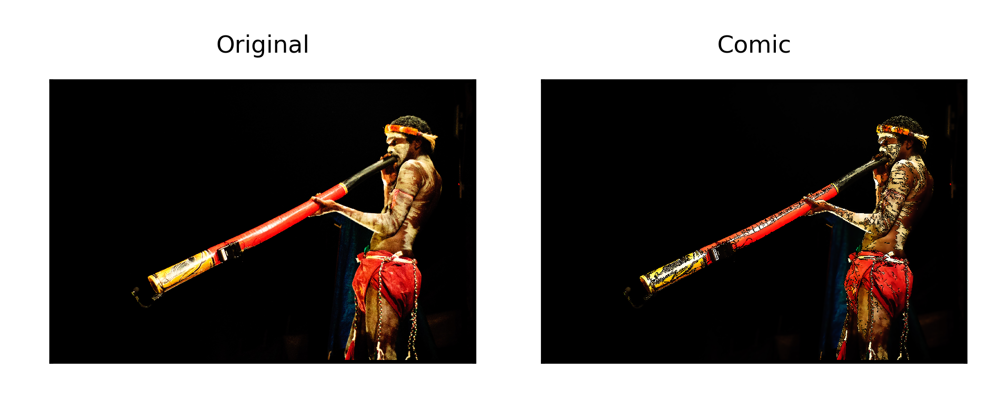

In [4]:
foto_1 = '/Users/iki/Desktop/Cualquier_cosa/Didgeridoo.jpg'
small_orig = cv2.cvtColor(cv2.imread(foto_1), cv2.COLOR_BGR2RGB)
small_orig = cv2.resize(small_orig, (0,0), fx=0.7, fy=0.7)
filtered_img = comic(small_orig, [50,150])
plotNImages([small_orig, filtered_img], 1,2, titles=['Original', 'Comic'])

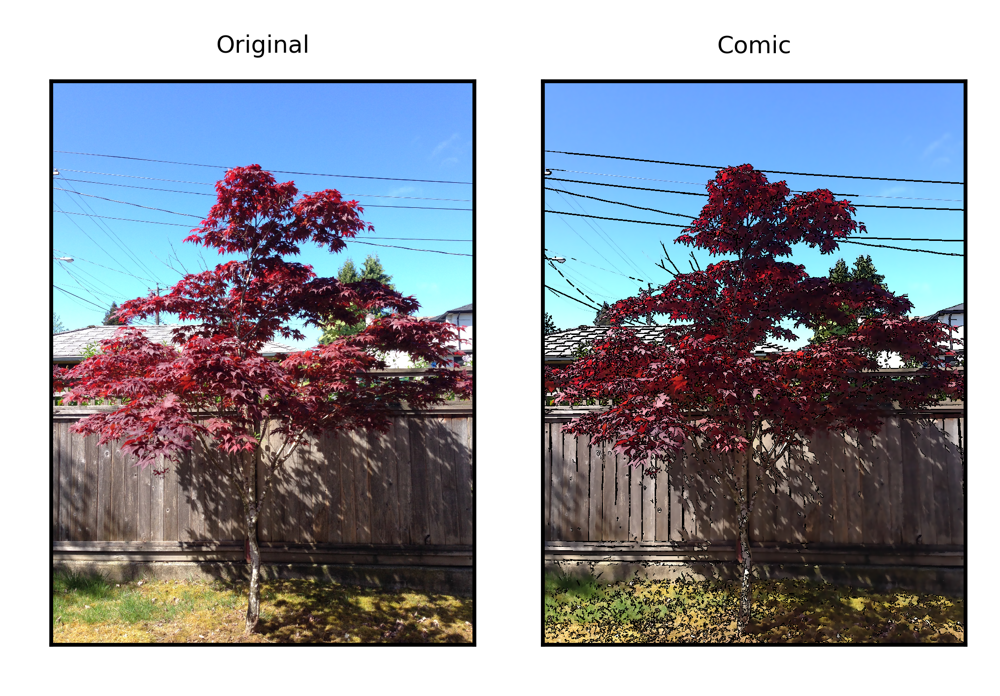

In [5]:
foto_3 = '/Users/iki/Desktop/Cualquier_cosa/IMG_6139.jpg'#fotos/draw.jpg'
orig_image3 = cv2.cvtColor(cv2.imread(foto_3), cv2.COLOR_BGR2RGB)
small_orig3 = orig_image3
small_orig3 = cv2.resize(orig_image3, (0,0), fx=0.7, fy=0.7)
filtered_img3 = comic(small_orig3, [100,240])
plotNImages([small_orig3, filtered_img3], 1, 2, titles=['Original', 'Comic'])

In [6]:
'''
The following code has been taken from: https://stackoverflow.com/a/37121993
'''
def clipped_zoom(img, zoom_factor, **kwargs):
    h, w = img.shape[:2]
    # For multichannel images we don't want to apply the zoom factor to the RGB
    # dimension, so instead we create a tuple of zoom factors, one per array
    # dimension, with 1's for any trailing dimensions after the width and height.
    zoom_tuple = (zoom_factor,) * 2 + (1,) * (img.ndim - 2)
    # Zooming out
    if zoom_factor < 1:
        # Bounding box of the zoomed-out image within the output array
        zh = int(np.round(h * zoom_factor))
        zw = int(np.round(w * zoom_factor))
        top = (h - zh) // 2
        left = (w - zw) // 2

        # Zero-padding
        out = np.zeros_like(img)
        out[top:top+zh, left:left+zw] = zoom(img, zoom_tuple, **kwargs)
    # Zooming in
    elif zoom_factor > 1:
        # Bounding box of the zoomed-in region within the input array
        zh = int(np.round(h / zoom_factor))
        zw = int(np.round(w / zoom_factor))
        top = (h - zh) // 2
        left = (w - zw) // 2
        out = zoom(img[top:top+zh, left:left+zw], zoom_tuple, **kwargs)
        # `out` might still be slightly larger than `img` due to rounding, so
        # trim off any extra pixels at the edges
        trim_top = ((out.shape[0] - h) // 2)
        trim_left = ((out.shape[1] - w) // 2)
        out = out[trim_top:trim_top+h, trim_left:trim_left+w]
    # If zoom_factor == 1, just return the input array
    else:
        out = img
    return out

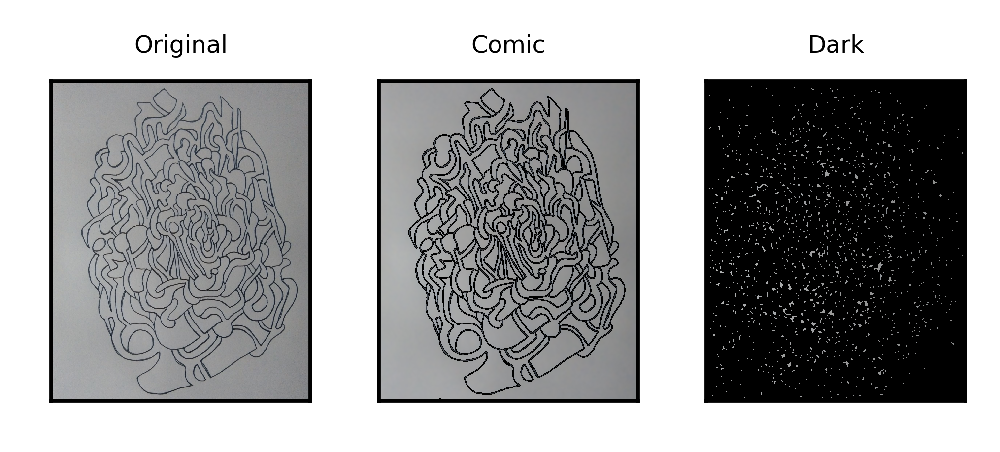

In [7]:
foto_2 = '/Users/iki/Desktop/bobby_design.png' #Cualquier_cosa/fotos/IMG_4416.jpg'
orig_image2 = cv2.cvtColor(cv2.imread(foto_2), cv2.COLOR_BGR2RGB)
small_orig2 = orig_image2
small_orig2 = cv2.resize(orig_image2, (0,0), fx=0.7, fy=0.7)
filtered_img2 = comic(small_orig2, [50,90])
dark = comic(small_orig2, [5,10],(7,7))
plotNImages([small_orig2, filtered_img2,dark], 1, 3, titles=['Original', 'Comic','Dark'])

In [8]:
### Canny Edge Detection and Hough Lines and plotting
foto_2 = '/Users/iki/Desktop/bobby_design.png' # Cualquier_cosa/fotos/IMG_4416.jpg'
img2 = cv2.cvtColor(cv2.imread(foto_2),cv2.COLOR_BGR2RGB)
comic2 = cv2.cvtColor(comic(img2,[100,200],edge_size=(7,7)),cv2.COLOR_RGB2GRAY)
kernel = np.ones((3,3), np.uint8)
ret, thresh = cv2.threshold(comic2,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
(_, contours, hierarchy) = cv2.findContours(thresh,mode=cv2.RETR_CCOMP,method=cv2.CHAIN_APPROX_SIMPLE)
cont = cv2.drawContours(img2, contours, -1, (185,100,235),3)

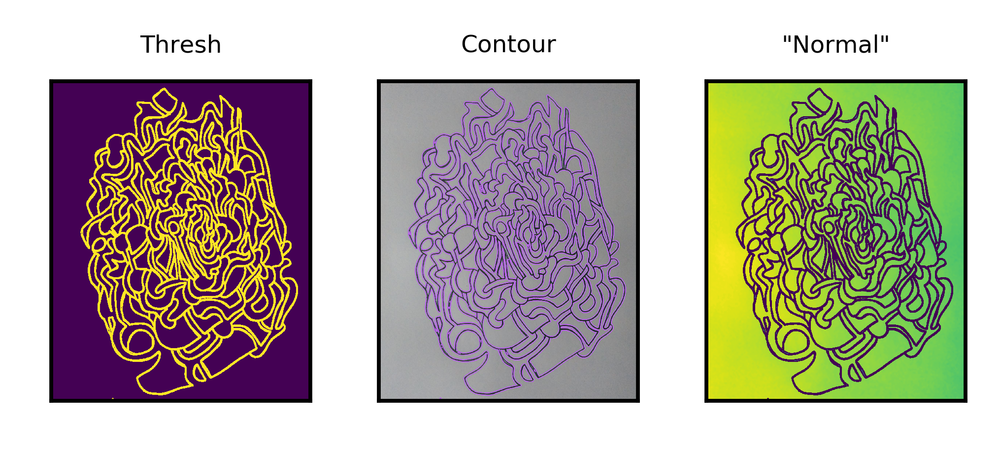

In [9]:
# POST comic processing
plotNImages([thresh, cont, comic2],1,3,titles=['Thresh','Contour','"Normal"'])

In [10]:
'''
Some cmaps:
    - viridis
    - plasma
    - inferno
    - magma
    - cividis
    - spring
    - summer
    - autumn
    - winter
    - cool
    - hot
    - Spectral
    - twilight
    - hsv
    - ocean
    - terrain
    - cubehelix
    - rainbow
''';

In [8]:
def getBlobsFromImg(orig_img):
    origImg = cv2.cvtColor(orig_img,cv2.COLOR_BGR2RGB)
    comicImg = cv2.cvtColor(comic(orig_img,[100,200],edge_size=(7,7)),cv2.COLOR_RGB2GRAY)
    ret, threshImg = cv2.threshold(comicImg,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    cv2.floodFill(threshImg,None,(0,0),255)
    threshImg = 255-threshImg
    colorImg = threshImg.copy()
    yxr = blob_log(threshImg,min_sigma=5,max_sigma=20, num_sigma=1,overlap=0.9,threshold=.37)
    #yxr = blob_doh(threshImg,min_sigma=5, max_sigma=8, num_sigma=1,overlap=0.9,threshold=.016)
    blobs = []
    curr = colorImg.copy()
    curr[:]=0
    prev = curr.copy()
    min_val = 10
    for y,x,r in yxr:
        blob = threshImg.copy()
        blob[blob==255]=min_val-1
        pos=(int(x),int(y))
        color=np.random.randint(min_val+1,high=250)
        cv2.floodFill(blob,None,pos,color)
        blob[blob<=min_val]=0
        curr[blob>=min_val] = 255
        if sum(sum(prev))!=sum(sum(curr)):
            colorImg[blob>min_val-1]=color
            prev = curr.copy()
            blobs.append(blob)
        else:
            curr = prev.copy()
    cv2.floodFill(colorImg,None,(0,1),0)
    return colorImg, np.array(blobs)

In [9]:
def getBlobsFromPath(path_to_img):
    origImg = cv2.cvtColor(path_to_img,cv2.COLOR_BGR2RGB)
    comicImg = cv2.cvtColor(comic(origImg,[100,200],edge_size=(7,7)),cv2.COLOR_RGB2GRAY)
    ret, threshImg = cv2.threshold(comicImg,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    cv2.floodFill(threshImg,None,(0,0),255)
    threshImg = 255-threshImg
    colorImg = threshImg.copy()
    #yxr = blob_log(threshImg,min_sigma=5,max_sigma=20, num_sigma=1,overlap=0.9,threshold=.37)
    yxr = blob_doh(threshImg,min_sigma=5, max_sigma=8, num_sigma=1,overlap=0.9,threshold=.016)
    blobs = []
    curr = colorImg.copy()
    curr[:]=0
    prev = curr.copy()
    min_val = 10
    for y,x,r in yxr:
        blob = threshImg.copy()
        blob[blob==255]=min_val-1
        pos=(int(x),int(y))
        color=np.random.randint(min_val+1,high=250)
        cv2.floodFill(blob,None,pos,color)
        blob[blob<=min_val]=0
        curr[blob>=min_val] = 255
        if sum(sum(prev))!=sum(sum(curr)):
            colorImg[blob>min_val-1]=color
            prev = curr.copy()
            blobs.append(blob)
        else:
            curr = prev.copy()
    cv2.floodFill(colorImg,None,(0,1),0)
    return colorImg, np.array(blobs)

In [10]:
def resizeAndRotateBlob(blob,coloredImg,ratio=1.0,angle=0):
    missingBlob = coloredImg.copy()
    missingBlob[blob>1]=0
    funkyImg = missingBlob.copy()
    new_blob = blob.copy()
    poly = np.nonzero(new_blob)
    x0=poly[0].min()
    x1=poly[0].max()
    y0=poly[1].min()
    y1=poly[1].max()
    center=(int((x0+x1)/2),int((y0+y1)/2))
    new_blob=blob[x0:x1,y0:y1]
    new_blob=zoom(new_blob,ratio)
    new_blob=rotate(new_blob,angle=angle)
    if len(new_blob) == 0:
        return coloredImg
    (width,height)=new_blob.shape
    (new_x,new_y)=(int(center[0]-width/2),int(center[1]-height/2))

    big_x = slice(max(0,new_x),max(min(new_x+width,funkyImg.shape[0]),0))
    big_y = slice(max(0,new_y),max(min(new_y+height,funkyImg.shape[1]),0))

    new_blob_x = slice(max(0,-new_x),min(-new_x+funkyImg.shape[0], width))
    new_blob_y = slice(max(0,-new_y),min(-new_y+funkyImg.shape[1], height))
    mask = funkyImg.copy()
    mask[:]=0
    kernel = np.ones((7,7),np.uint8)
    dilated = cv2.dilate(new_blob,kernel)[new_blob_x,new_blob_y]
    mask[big_x,big_y] += dilated
    funkyImg[mask>1]=0
    funkyImg[big_x,big_y] += new_blob[new_blob_x,new_blob_y]
    return funkyImg

In [11]:
def resizeAndRotateMany(blobs,coloredImg,ratios,angles,function,idx):
    funkyImg = coloredImg.copy()
    for i in range(len(blobs)):
        funkyImg = resizeAndRotateBlob(blobs[i],funkyImg,
                                       ratio=func(function[i][0],ratios[i],idx),
                                       angle=350*func(function[i][1],angles[i],idx))
    return funkyImg

In [55]:
def findObjectInImage(path_to_img,path_to_object='/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta.JPG'):
    img1 = cv2.imread(path_to_object)
    img2 = cv2.cvtColor(cv2.imread(path_to_img),cv2.COLOR_BGR2RGB)
    sift = cv2.xfeatures2d.SIFT_create()
    # find the keypoints and descriptors with SIFT
    
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50)   # or pass empty dictionary

    flann = cv2.FlannBasedMatcher(index_params,search_params)

    matches = flann.knnMatch(des1,des2,k=2)
    sorted_matches = sorted(matches, key= lambda x:math.sqrt(math.pow(x[0].distance,2)+
                                                             math.pow(x[1].distance,2)))

    src_pts = np.float32([kp1[m[0].queryIdx].pt for m in sorted_matches]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m[0].trainIdx].pt for m in sorted_matches ]).reshape(-1,1,2)
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)

    #sorted_matches = sorted_matches[:15]
    # Need to draw only good matches, so create a mask
    matchesMask = [[0,0] for i in range(len(matches))]

    # ratio test as per Lowe's paper
    for i,(m,n) in enumerate(matches):
        if m.distance < 0.15*n.distance:
            matchesMask[i]=[1,0]

    h,w = img1.shape[:2]
    pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)
    dst_extra = dst.copy()
    dst_extra += (w,0)

    draw_params = dict(matchColor = (0,0,255),
                       singlePointColor = (255,0,0),
                       matchesMask = matchesMask,
                       flags = 0)

    img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,sorted_matches,None,**draw_params)
    img3 = cv2.polylines(img3, [np.int32(dst_extra)],True, (0,255,0),5,cv2.LINE_AA)
    min_x = int(min(dst[:,0,1]))
    max_x = int(max(dst[:,0,1]))
    min_y = int(min(dst[:,0,0]))
    max_y = int(max(dst[:,0,0]))
    img_alpha = np.ones((img2.shape[0],img2.shape[1]),dtype=img2.dtype)
    for x in range(min_x,max_x):
        for y in range(min_y,max_y):
            if cv2.pointPolygonTest(dst,(y,x),False) >= 0:
                img_alpha[x,y] = 0
    cropped = img2[min_x:max_x, min_y:max_y]
    obj_alpha = 1-img_alpha[min_x:max_x, min_y:max_y]
    return cropped, (min_x, max_x, min_y, max_y), img2, img_alpha, obj_alpha

In [56]:
def reinsertObjectToImg(obj,img,limits,obj_alpha,mapping='viridis'):
    min_x = limits[0]
    max_x = limits[1]
    min_y = limits[2]
    max_y = limits[3]
    cmap = mcm.get_cmap(mapping)
    color_obj = cmap(obj)*255
    color_obj[:,:,3] = obj_alpha
    img_alpha = 1.0-obj_alpha
    #img[min_x:max_x,min_y:max_y] = color_obj
    for c in range(3):
        img[min_x:max_x,min_y:max_y, c] = (obj_alpha*color_obj[:,:,c]+
                                           img_alpha*img[min_x:max_x,min_y:max_y, c])
    return img, color_obj

In [57]:
def func(choice, var, idx):
    result = 1
    if choice == 0:
            result = np.sin(var*idx)+1.01
    elif choice == 1:
            result = np.cos(var*idx)+1.01
    elif choice ==  2:
            result = np.sin(np.sin(var*idx)*idx)+1.01
    elif choice ==  3:
            result = np.cos(np.cos(idx)*var*idx)+1.01
    if result > 3 or result < 0.1:
        result = np.random.randint(1,3)/2
    return round(result,2)

In [ ]:
def makeSequence(image_path,path_to_object='/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta.JPG',dark_ratio=0.0,length=24,mapping='viridis', num_blobs=None):
    obj,limits,img,img_alpha,obj_alpha = findObjectInImage(image_path,path_to_object=path_to_object)
    colorImg, blobs = getBlobsFromImg(obj)
    sequence = []
    if (len(blobs) != 0):
        if num_blobs==None:
            num_blobs = np.random.randint(2,max(4,int(len(blobs)/2)))
        blob_ids = np.random.randint(0,len(blobs)-1,num_blobs)
        print('Number of blobs chosen: ', num_blobs)
        size_vars = np.random.randint(1,4,num_blobs)/np.random.randint(1,5,num_blobs)
        angle_vars = np.random.randint(1,4,num_blobs)/np.random.randint(1,5,num_blobs)
        func_vars = [[np.random.randint(0,4),np.random.randint(0,4)] for i in range(num_blobs)]
        for idx in range(length):
            if idx <= dark_ratio*length:
                thresholds = [1,idx]
                result = 90-cv2.cvtColor(comic(obj,thresholds,(7,7),inv=True), cv2.COLOR_RGB2GRAY)
                result[result==0]=255
            else:
                result = resizeAndRotateMany(blobs[blob_ids],colorImg,
                                             size_vars, angle_vars, func_vars, idx)
            sequence.append(result)
    final_sequence = []
    for scene in sequence:
        r,g,b = cv2.split(img)
        im = cv2.merge((r,g,b,img_alpha))
        newImg, colorObj = reinsertObjectToImg(scene,im,limits,obj_alpha,mapping=mapping)
        final_sequence.append(newImg)
    return final_sequence

In [68]:
def helper(count, im):
    seq = []
    path_to_obj = '/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta{}.JPG'.format(count%4)
    try:
        if count > 60:
            seq = makeSequence(str(im),path_to_object=path_to_obj,
                                dark_ratio=0.0,length=40,mapping='inferno')
        else:
            seq = makeSequence(str(im),path_to_object=path_to_obj,
                                dark_ratio=1.0,length=40,mapping='inferno')
    except Exception as e:
        print(e)
    for i, img in enumerate(seq):
        img = cv2.resize(img,(1024,768))
        img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
        cv2.imwrite('/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/'+
                    'images_exploration/fotos_listas/{}.jpg'.format(i+40*count),
                    img)
    #seq = []
    #print(count)
    #path_to_obj = '/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta{}.JPG'.format(count%4)
    #try:
    #    if count > 60:
    #        seq += makeSequence(str(im),path_to_object=path_to_obj,
    #                            dark_ratio=0.0,length=40,mapping='inferno')
    #    else:
    #        seq += makeSequence(str(im),path_to_object=path_to_obj,
    #                            dark_ratio=1.0,length=40,mapping='inferno')
    #    print('seq is: ', len(seq))
    #except Exception as e:
    #    print(e)
    #print('sigue')
    #if len(seq) > 2:
    #    print('video start')
    #    start_vid = time.time()
    #    name = '/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/videos/video_{}.avi'.format(count)
    #    fourcc = cv2.VideoWriter_fourcc(*'avc1')
    #    out = cv2.VideoWriter(name,fourcc,20.0,(1024,768))
    #    for im in seq:
    #        im = cv2.resize(im,(1024,768))
    #        out.write(im)
    #    out.release()
    #    print('Time for video: ',time.time()-start_vid)
    return seq

In [69]:
start = time.time()
fotos_dir = Path.home().joinpath('Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos')
jpgs = fotos_dir.glob('*.JPG')
ordered = []
for count, jpg in enumerate(jpgs):
    ordered.append(jpg)
ordered = sorted(ordered,reverse=True)
seq = []

for count, im in enumerate(tqdm(ordered)):
    path_to_obj = '/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta{}.JPG'.format(count%4)
    try:
        if count > 60:
            seq = makeSequence(str(im),path_to_object=path_to_obj,
                                dark_ratio=0.0,length=40,mapping='inferno')
        else:
            seq = makeSequence(str(im),path_to_object=path_to_obj,
                                dark_ratio=1.0,length=40,mapping='inferno')
    except Exception as e:
        print(e)
    for i, img in enumerate(seq):
        img = cv2.resize(img,(1024,768))
        img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
        cv2.imwrite('/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/'+
                    'images_exploration/fotos_listas/{}.jpg'.format(i+40*count),
                    img)
    seq = []
#pool = mp.Pool(processes=mp.cpu_count())
#process = pool.starmap(helper,[(count, im) for count, im in enumerate(ordered)])
#seq += [p for p in tqdm(process.get())]
print('Time for completion: ', time.time()-start)

Process ForkPoolWorker-227:
Process ForkPoolWorker-228:
Process ForkPoolWorker-225:
Process ForkPoolWorker-226:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self

KeyboardInterrupt: 

  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/queues.py", line 351, in get
    with self._rlock:
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_bytes(maxlength)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
KeyboardInterrupt
KeyboardInterrupt
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/connection.py", line 379, in _recv
    ch

In [53]:
start = time.time()
#seq = makeSequence('/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos/IMG_4172.JPG',
#                   path_to_object='/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta0.JPG',
#                   dark_ratio=0.5,length=10,mapping='inferno')
#mimsave('./ideaInv3.gif',seq)

helper(1,'/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos/IMG_4172.JPG')
print('Time for completion: ', time.time()-start)
# Dark dark = comic(small_orig2, [5,10],(7,7))

# Gray
# Color
# Possibly plants
# Possibly people

1
(3174, 2118, 3)
/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos/IMG_4172.JPG
(3024, 4032, 3)
Number of blobs chosen:  62
seq is:  41
sigue
video start
Time for video:  0.6658580303192139
Time for completion:  102.43594121932983


In [727]:
start = time.time()
fullImg, blobs = getBlobsFromPath('/Users/iki/Desktop/bobby_design.png')
print(time.time() - start)

9.499746084213257


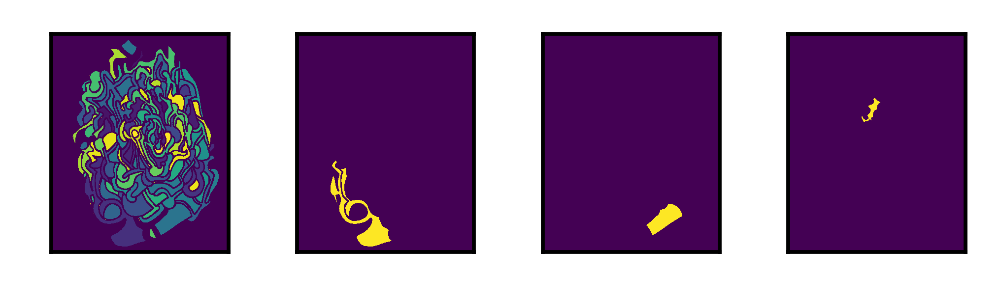

In [728]:
plotNImages([fullImg,blobs[0],blobs[2],blobs[100]],1,4)

In [718]:
nums = np.random.randint(0,len(blobs),2)
rotated_blobs = rotateBlobs(blobs[[0,2,4]],fullImg,angle=45)
biggerBlob = resizeBlob(blobs[0],fullImg,ratio=2.0)
allIn = resizeAndRotateBlob(blobs[0],fullImg,ratio=2,angle=60)
many = resizeAndRotateMany(blobs[[0,2,4]],fullImg,[0.5,1.5,2],[30,100,55])

/Users/iki/anaconda3/envs/grsj/lib/python3.7/site-packages/scipy/ndimage/interpolation.py:611: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


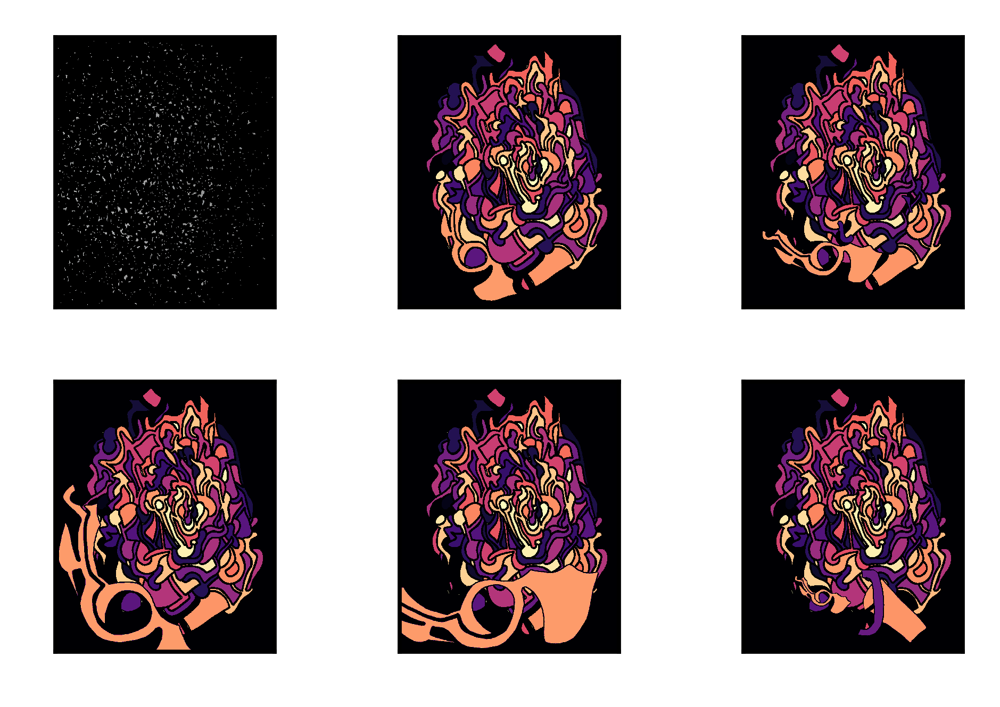

In [722]:
plotNImages([dark,fullImg,funkyImg,biggerBlob,allIn,many],2,3,figsize=(3,2),cscheme='magma')

In [723]:
sequence = []
for i in range(25):
    sequence.append(resizeAndRotateBlob(blobs[0],fullImg,np.sin(i)+1.01,350*(np.cos(2*i)+1.01)))
mimsave('./primer1.gif',sequence)

<img src='./primer1.gif' alt='drawing' width='200'/>

In [852]:
sequenceMany = []
for i in range(25):
    sequenceMany.append(resizeAndRotateMany(blobs[[0,2,100,130]],
                                            fullImg,
                                            [0.25,1.3,2,1],
                                            [0.7,1.4,5,2],
                                            [[3,2],[1,1],[3,0],[2,1]],
                                            i))
mimsave('./tercero3.gif',sequenceMany)

<img src='./tercero3.gif' alt='drawing' width='400'/>

In [781]:
img1 = cv2.imread('/Users/iki/Desktop/bobby_design.png',0)
img2 = cv2.imread('/Users/iki/Desktop/esta.png',0)
sift = cv2.xfeatures2d.SIFT_create()
# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)

# FLANN parameters
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)   # or pass empty dictionary

flann = cv2.FlannBasedMatcher(index_params,search_params)

matches = flann.knnMatch(des1,des2,k=2)
sorted_matches = sorted(matches, key= lambda x:math.sqrt(math.pow(x[0].distance,2)+
                                                         math.pow(x[1].distance,2)))

src_pts = np.float32([kp1[m[0].queryIdx].pt for m in sorted_matches]).reshape(-1,1,2)
dst_pts = np.float32([ kp2[m[0].trainIdx].pt for m in sorted_matches ]).reshape(-1,1,2)
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)

#sorted_matches = sorted_matches[:15]
# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.1*n.distance:
        matchesMask[i]=[1,0]

h,w = img1.shape[:2]
pts = np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
dst = cv2.perspectiveTransform(pts,M)
dst_extra = dst.copy()
dst_extra += (w,0)
        
draw_params = dict(matchColor = (0,0,255),
                   singlePointColor = (255,0,0),
                   matchesMask = matchesMask,
                   flags = 0)

img3 = cv2.drawMatchesKnn(img1,kp1,img2,kp2,sorted_matches,None,**draw_params)
img3 = cv2.polylines(img3, [np.int32(dst_extra)],True, (0,255,0),5,cv2.LINE_AA)

cropped = img2[int(min(dst[:,0,1])):int(max(dst[:,0,1])),
               int(min(dst[:,0,0])):int(max(dst[:,0,0]))]



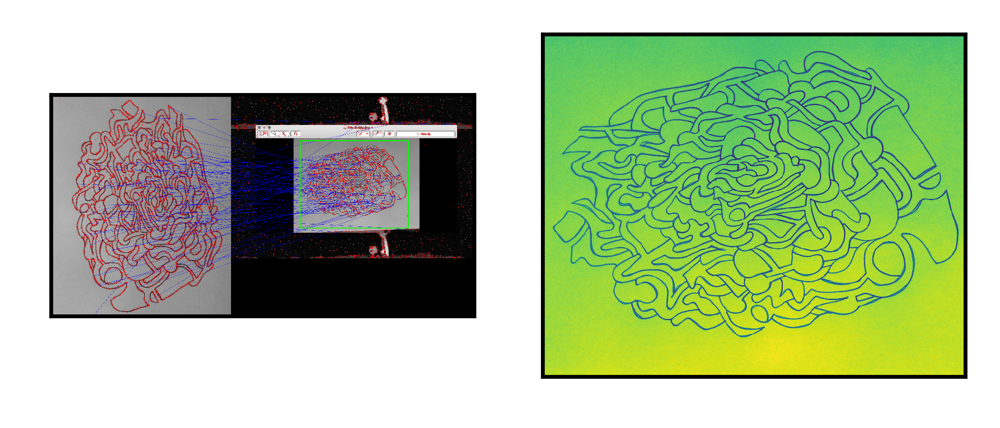

In [782]:
plotNImages([img3,cropped],1,2)

In [804]:
obj,limits,img = findObjectInImage('/Users/iki/Desktop/esta.png')
partImg, pblobs = getBlobsFromImg(obj)
newObj = resizeAndRotateMany(pblobs[[0,14,6,15,50,20,53,100]],partImg,[.5,1,1,3,2,1.5,2,2.5],[8,100,45,13,300,51,45,90])
newImg, colorOb = reinsertObjectToImg(newObj,img.copy(),limits)

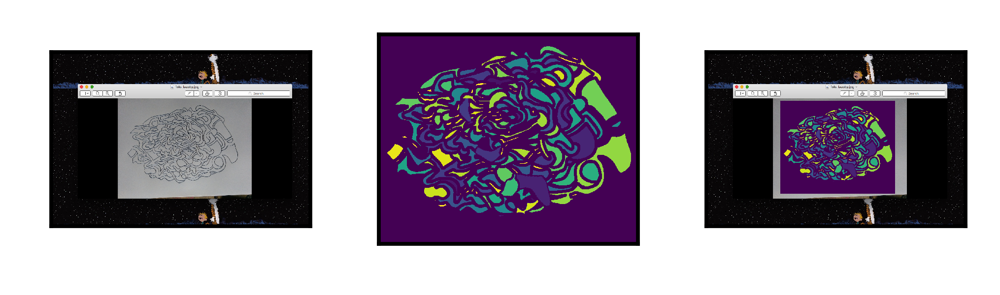

In [805]:
plotNImages([img,newObj,newImg],1,3)

In [20]:
fotos_dir = Path.home().joinpath('Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos')

In [152]:
start = time.time()
jpgs = fotos_dir.glob('*.JPG')
ordered = []
for count, jpg in enumerate(jpgs):
    ordered.append(jpg)
ordered = sorted(ordered,reverse=True)
seq = []
for count, im in enumerate(tqdm(ordered)):
    try:
        if count > 60:
            seq += makeSequence(str(im),dark_ratio=0.0,length=40,mapping='inferno')
        else:
            seq += makeSequence(str(im),dark_ratio=1.0,length=40,mapping='inferno')
    except Exception as e:
        print(e)
    if count % 10 == 0:
        start_vid = time.time()
        name = './video_{}.avi'.format(count)
        fourcc = cv2.VideoWriter_fourcc(*'avc1')
        out = cv2.VideoWriter(name,fourcc,20.0,(1024,768))
        for im in seq:
            im = cv2.resize(im,(1024,768))
            out.write(im)
        out.release()
        print('Time for video: ',time.time()-start_vid)   
print('Time for completion: ', time.time()-start)














  0%|          | 0/322 [00:00<?, ?it/s]












  0%|          | 1/322 [00:09<50:31,  9.44s/it]

OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/core/src/matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'locateROI'

Time for video:  0.0859367847442627















  1%|          | 2/322 [00:16<46:03,  8.63s/it]

OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/core/src/matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'locateROI'
















  1%|          | 3/322 [00:22<41:45,  7.85s/it]

OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/core/src/matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'locateROI'
















  1%|          | 4/322 [00:28<39:35,  7.47s/it]

OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/core/src/matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'locateROI'
















  2%|▏         | 5/322 [00:38<42:40,  8.08s/it]

OpenCV(3.4.2) /opt/concourse/worker/volumes/live/9523d527-1b9e-48e0-7ed0-a36adde286f0/volume/opencv-suite_1535558719691/work/modules/core/src/matrix.cpp:755: error: (-215:Assertion failed) dims <= 2 && step[0] > 0 in function 'locateROI'

140
Number of blobs chosen:  25















  2%|▏         | 6/322 [02:28<3:23:15, 38.59s/it]

KeyboardInterrupt: 

In [159]:
 start = time.time()
seq = makeSequence('/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos/IMG_3810.JPG',
                   path_to_object='/Users/iki/Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/esta.JPG',
                   dark_ratio=0.0,length=20,mapping='inferno')
mimsave('./test1.gif',seq)
print('Time for completion: ', time.time()-start)

Number of blobs chosen:  4
Time for completion:  110.76012396812439


In [26]:
start = time.time()
fotos_dir = Path.home().joinpath('Desktop/UBC/semestre_9/GRSJ_224F/images_exploration/fotos')
jpgs = fotos_dir.glob('*.JPG')
ordered = []
for count, jpg in enumerate(jpgs):
    ordered.append(jpg)
ordered = sorted(ordered,reverse=True)
seq = []
pool = mp.Pool(processes=mp.cpu_count())
process = pool.starmap(helper,[(count, im) for count, im in enumerate(ordered)])
seq += [p for p in tqdm(process.get())]
print('Time for completion: ', time.time()-start)

19
38
0
57
76
95
114
133
152
171
190
209
228
247
266
285


Process ForkPoolWorker-24:
Process ForkPoolWorker-23:
Process ForkPoolWorker-26:
Process ForkPoolWorker-25:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/pool.py", line 110, in worker
  

KeyboardInterrupt: 

Process ForkPoolWorker-31:
Process ForkPoolWorker-30:
Process ForkPoolWorker-29:
Process ForkPoolWorker-27:
Process ForkPoolWorker-28:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/iki/anaconda3/envs/grsj/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/iki/anaconda3/envs/grsj/